# Hackathon Ekimetrics 2023

L'objectif de ce Hackathon est d'implémenter un algorithme permettant à une entreprise d'automatiser son processus de recrutement, en s'assurant que l'algorithme de sélection ne reproduise aucun biais discriminatoire.

### Biais a priori

Lors de la mise en œuvre d'un système d'IA, l'équité et les préjugés doivent être un élément important lors de la conception, en particulier lorsqu'il s'agit d'informations sensibles, et/ou d'informations personnelles identifiables (PII), et/ou d'informations personnelles sur la santé (PHI). En effet, non seulement ces informations sont soumises à la loi (par exemple, le GDPR en Europe), mais elles sont également soumises à un défi en termes d'image de marque.
L'exemple d'aujourd'hui vise à attribuer un risque aux données de recrutement.
Avant de mettre en œuvre un système d'IA pour prédire la probabilité d'embauche d'un candidat, les ingénieurs en IA et les parties prenantes de l'entreprise devraient :

- Se situer et identifier les sources potentielles de biais
- Définir une ou plusieurs mesures qui quantifieront les biais du système d'IA.

https://www.hirevue.com/blog/hiring/what-is-adverse-impact-and-why-measuring-it-matters

### Dataset

L'enquête annuelle de StackOverflow auprès des développeurs (plus de 70 000 réponses provenant de plus de 180 pays) examine tous les aspects de l'expérience des développeurs, de l'apprentissage du code aux technologies préférées, en passant par le contrôle des versions et l'expérience professionnelle.

Nous disposons des données suivantes : 


- Age: age of the applicant, >35 years old or <35 years old (categorical)

- EdLevel: education level of the applicant (Undergraduate, Master, PhD...) (categorical)

- Gender: gender of the applicant, (Man, Woman, or NonBinary) (categorical)

- MainBranch: whether the applicant is a profesional developer (categorical)

- YearsCode: how long the applicant has been coding (integer)

- YearsCodePro: how long the applicant has been coding in a professional context, (integer)

- PreviousSalary: the applicant's previous job salary (float)

- ComputerSkills: number of computer skills known by the applicant (integer)

- Employed: target variable, whether the applicant has been hired (categorical)

In [279]:
pip install dalex

In [280]:
#Importation des librairies nécessaires 

import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import dalex as dx
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix
from dalex.fairness import resample, reweight, roc_pivot
from copy import copy
from sklearn.compose import make_column_transformer, make_column_selector, ColumnTransformer
from sklearn.pipeline import Pipeline 
from plotly.subplots import make_subplots


# Exploratory Data Analysis

In [281]:
#Chargement du dataset 
df = pd.read_csv('/Users/Blaze/Downloads//stackoverflow_full.csv', index_col=0)
# df = pd.read_csv('https://raw.githubusercontent.com/cominho/Hackathon-Ekimetrics/main/stackoverflow_full.csv?token=GHSAT0AAAAAACKRKK6JJCU5M6DPABA4YRNYZK6GFHQ')
df

,Age,Accessibility,EdLevel,Employment,Gender,MentalHealth,MainBranch,YearsCode,YearsCodePro,Country,PreviousSalary,HaveWorkedWith,ComputerSkills,Employed
0,<35,No,Master,1,Man,No,Dev,7,4,Sweden,51552.0,C++;Python;Git;PostgreSQL,4,0
1,<35,No,Undergraduate,1,Man,No,Dev,12,5,Spain,46482.0,Bash/Shell;HTML/CSS;JavaScript;Node.js;SQL;Typ...,12,1
2,<35,No,Master,1,Man,No,Dev,15,6,Germany,77290.0,C;C++;Java;Perl;Ruby;Git;Ruby on Rails,7,0
3,<35,No,Undergraduate,1,Man,No,Dev,9,6,Canada,46135.0,Bash/Shell;HTML/CSS;JavaScript;PHP;Ruby;SQL;Gi...,13,0
4,>35,No,PhD,0,Man,No,NotDev,40,30,Singapore,160932.0,C++;Python,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73457,<35,No,Undergraduate,1,Man,No,Dev,7,2,Germany,41058.0,C#;HTML/CSS;JavaScript;TypeScript;Docker;Kuber...,13,1
73458,>35,No,Undergraduate,1,Man,No,Dev,21,16,United States of America,115000.0,C#;HTML/CSS;Java;JavaScript;npm;ASP.NET Core ;...,11,1
73459,<35,No,Undergraduate,1,Man,No,Dev,4,3,Nigeria,57720.0,HTML/CSS;JavaScript;TypeScript;Docker;Express;...,12,1
73460,<35,Yes,Undergraduate,1,Man,Yes,Dev,5,1,United States of America,70000.0,C#;HTML/CSS;JavaScript;SQL;TypeScript;npm;Yarn...,15,1


In [282]:
df.columns

Index(['Age', 'Accessibility', 'EdLevel', 'Employment', 'Gender',
       'MentalHealth', 'MainBranch', 'YearsCode', 'YearsCodePro', 'Country',
       'PreviousSalary', 'HaveWorkedWith', 'ComputerSkills', 'Employed'],
      dtype='object')

In [283]:
#Nombre d'observations
nb_obs = df.shape[0]
nb_obs

73462

In [284]:
#Existence de valeurs manquantes 
miss_val = df.isna().any().any()
miss_val

True

In [285]:
#Nombre de valeurs manquantes par colonne 
miss_val_col = df.isna().sum()
miss_val_col

Age                0
Accessibility      0
EdLevel            0
Employment         0
Gender             0
MentalHealth       0
MainBranch         0
YearsCode          0
YearsCodePro       0
Country            0
PreviousSalary     0
HaveWorkedWith    63
ComputerSkills     0
Employed           0
dtype: int64

## Statistiques descriptives

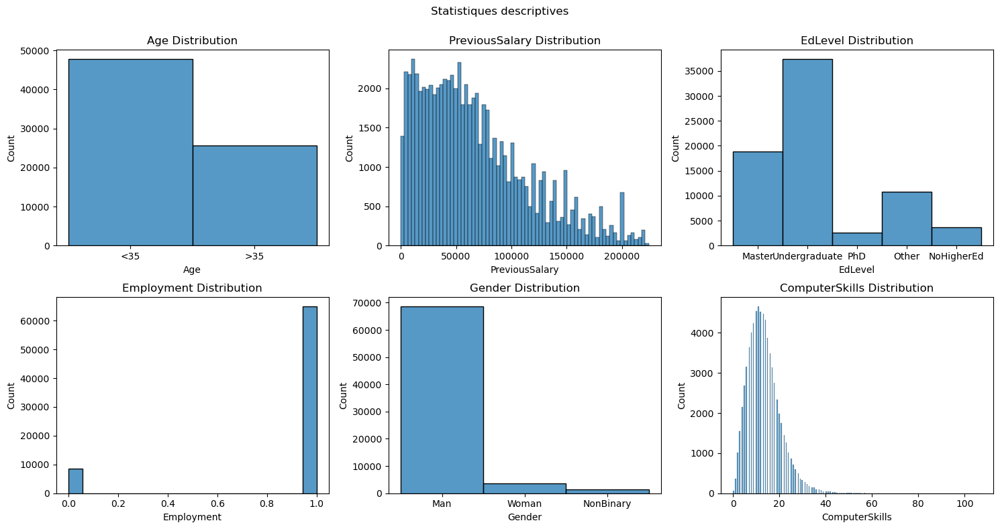

In [286]:
#Variables à inclure dans les statistiques descriptives
variables_to_describe = ['Age', 'PreviousSalary', 'EdLevel', 'Employment', 'Gender', 'ComputerSkills']

#Création d'une grille de sous-graphiques
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))
fig.suptitle('Statistiques descriptives')

for i, variable in enumerate(variables_to_describe):
    row, col = i // 3, i % 3
    sns.histplot(data=df, x=variable, ax=axes[row, col], kde=False)
    axes[row, col].set_title(f'{variable} Distribution')

plt.tight_layout()
plt.subplots_adjust(top=0.9)

plt.show()

In [287]:
fig = make_subplots(rows=1, cols=1)

colors = px.colors.sequential.Agsunset

for i, gender in enumerate(df['Gender'].unique()):
    data = df[df['Gender'] == gender]
    fig.add_trace(go.Box(x=data['Gender'], y=data['PreviousSalary'], name=gender, marker=dict(color=colors[i])), row=1, col=1)

fig.update_layout(title='Distribution des salaires par genre')
fig.show()

In [288]:
colors = px.colors.sequential.Plasma  


fig = make_subplots(rows=1, cols=1)

unique_ages = df['Age'].unique()
unique_ages.sort() 

for i, age in enumerate(unique_ages):
    data = df[df['Age'] == age]
   
    color = colors[i % len(colors)]
    
    fig.add_trace(go.Box(
        x=data['Age'], 
        y=data['PreviousSalary'], 
        name=str(age), 
        marker=dict(color=color)
    ), row=1, col=1)


fig.update_layout(title='Distribution des salaires en fonction de l âge')

fig.show()

In [289]:
colors = px.colors.sequential.Plasma

fig = make_subplots(rows=1, cols=1)

ed_levels = df['EdLevel'].unique()
ed_levels.sort()

for i, ed_level in enumerate(ed_levels):
    data = df[df['EdLevel'] == ed_level]
    color = colors[i % len(colors)]
    
    fig.add_trace(go.Box(
        x=data['EdLevel'], 
        y=data['PreviousSalary'], 
        name=ed_level, 
        marker=dict(color=color)
    ), row=1, col=1)

fig.update_layout(
    title="Distribution des salaires par niveau d'éducation",
    xaxis_tickangle=-45
)

fig.show()

In [290]:
colors = px.colors.sequential.Plasma

fig = make_subplots(rows=1, cols=1)

mental_health_statuses = df['MentalHealth'].unique()
mental_health_statuses.sort()

for i, status in enumerate(mental_health_statuses):
    data = df[df['MentalHealth'] == status]
    color = colors[i % len(colors)]
    
    fig.add_trace(go.Box(
        x=data['MentalHealth'], 
        y=data['PreviousSalary'], 
        name=status, 
        marker=dict(color=color)
    ), row=1, col=1)

fig.update_layout(title='Distribution des salaires et maladie mentale')

fig.show()

In [291]:
colors = px.colors.sequential.Plasma

fig = make_subplots(rows=1, cols=1)

employed_statuses = df['Employed'].unique()
employed_statuses.sort()

for i, status in enumerate(employed_statuses):
    data = df[df['Employed'] == status]
    color = colors[i % len(colors)]

    fig.add_trace(go.Box(
        x=data['Employed'].astype(str), 
        y=data['PreviousSalary'], 
        name=str(status), 
        marker=dict(color=color)
    ), row=1, col=1)

fig.update_layout(title='Distribution des salaires en fonction du statut salarial')

fig.show()

In [292]:
colors = px.colors.sequential.Inferno

fig = make_subplots(rows=1, cols=1)

main_branches = df['MainBranch'].unique()
main_branches.sort()

for i, branch in enumerate(main_branches):
    data = df[df['MainBranch'] == branch]
    color = colors[i % len(colors)]
    
    fig.add_trace(go.Violin(
        x=data['MainBranch'].astype(str), 
        y=data['PreviousSalary'], 
        name=str(branch), 
        line_color=color
    ), row=1, col=1)

fig.update_layout(
    title='Distribution des salaires par branche de travail',
    xaxis_tickangle=-45
)

fig.show()

On explore par ailleurs notre variable cible pour s'assurer que les 2 catégories ne sont pas numériquement désquilibrées, car cela pourrait nous poser problème pendant la modélisation si tel est le cas. 

In [293]:
employed_proportion = df['Employed'].value_counts(normalize=True)

fig = px.bar(
    x=employed_proportion.index, 
    y=employed_proportion.values, 
    labels={'x': 'Employed', 'y': 'Proportion'}, 
    title='Proportion de personnes Employed'
)
fig.update_layout(showlegend=False)
fig.update_traces(marker_color=px.colors.sequential.Aggrnyl)
fig.show()

###  Funnels durant le processus de recrutement

In [372]:

selected_genders = ['Man', 'Woman', 'NonBinary']
filtered_df = df[df['Gender'].isin(selected_genders)]

# Count the number of people at each stage for each gender
applicant_counts = filtered_df.groupby('Gender').size().reindex(selected_genders, fill_value=0)
employed_counts = filtered_df[filtered_df['Employed'] == 1].groupby('Gender').size().reindex(selected_genders, fill_value=0)

# Create a DataFrame for Plotly
plot_data = pd.DataFrame({
    'Gender': selected_genders * 2,
    'Stage': ['Applicants'] * len(selected_genders) + ['Employed at the end'] * len(selected_genders),
    'Count': list(applicant_counts) + list(employed_counts)
})

# Define colors for each gender
colors = {'Man': 'orange', 'Woman': 'purple', 'NonBinary': 'green'}
plot_data['Color'] = plot_data['Gender'].map(colors)

# Create a funnel plot with Plotly
fig = px.funnel(
    plot_data,
    x='Count',
    y='Stage',
    color='Gender',
    color_discrete_map=colors,
    title='Recruiting Funnel by Gender',
    labels={'Count': 'Number of People', 'Gender': 'Gender', 'Stage': 'Recruiting Funnel Stage'},
)

# Show the plot
fig.show()


In [378]:


selected_health = ['Yes', 'No']
filtered_df = df[df['MentalHealth'].isin(selected_health)]

# Count the number of people at each stage for each gender
applicant_counts = filtered_df.groupby('MentalHealth').size().reindex(selected_health, fill_value=0)
employed_counts = filtered_df[filtered_df['Employed'] == 1].groupby('MentalHealth').size().reindex(selected_health, fill_value=0)

# Create a DataFrame for Plotly
plot_data = pd.DataFrame({
    'MentalHealth': selected_health * 2,
    'Stage': ['Applicants'] * len(selected_health) + ['Employed at the end'] * len(selected_health),
    'Count': list(applicant_counts) + list(employed_counts)
})

# Define colors for each gender
colors = {'Yes': 'pink', 'No': 'turquoise'}
plot_data['Color'] = plot_data['MentalHealth'].map(colors)

# Create a funnel plot with Plotly
fig = px.funnel(
    plot_data,
    x='Count',
    y='Stage',
    color='MentalHealth',
    color_discrete_map=colors,
    title='Recruiting Funnel by Mental Health issues',
    labels={'Count': 'Number of People', 'MentalHealth': 'Mental Health', 'Stage': 'Recruiting Funnel Stage'},
)

# Show the plot
fig.show()


In [376]:


selected_health = ['<35', '>35']
filtered_df = df[df['Age'].isin(selected_health)]

# Count the number of people at each stage for each gender
applicant_counts = filtered_df.groupby('Age').size().reindex(selected_health, fill_value=0)
employed_counts = filtered_df[filtered_df['Employed'] == 1].groupby('Age').size().reindex(selected_health, fill_value=0)

# Create a DataFrame for Plotly
plot_data = pd.DataFrame({
    'MentalHealth': selected_health * 2,
    'Stage': ['Applicants'] * len(selected_health) + ['Employed at the end'] * len(selected_health),
    'Count': list(applicant_counts) + list(employed_counts)
})

# Define colors for each gender
colors = {'<35': 'yellow', '>35': 'purple'}
plot_data['Color'] = plot_data['MentalHealth'].map(colors)

# Create a funnel plot with Plotly
fig = px.funnel(
    plot_data,
    x='Count',
    y='Stage',
    color='MentalHealth',
    color_discrete_map=colors,
    title='Recruiting Funnel by age',
    labels={'Count': 'Number of People', 'MentalHealth': 'Age', 'Stage': 'Recruiting Funnel Stage'},
)

# Show the plot
fig.show()


# Identification des biais 

In [295]:
gender_employed = df.groupby(['Gender', 'Employed']).size().unstack().fillna(0)
mental_health_employed = df.groupby(['MentalHealth', 'Employed']).size().unstack().fillna(0)
age_employed = df.groupby(['Age', 'Employed']).size().unstack().fillna(0)
previous_employed = df.groupby(['Employment', 'Employed']).size().unstack().fillna(0)

colors = px.colors.sequential.Plasma

fig = make_subplots(rows=2, cols=2, subplot_titles=(
    "Par genre",
    "Par maladie mentale",
    "Par tranche d'âge",
    "Par emploi précédent"
))

#Ajout des bar plots avec la palette de couleurs Plasma
for i, employed in enumerate(gender_employed.columns):
    fig.add_trace(go.Bar(x=gender_employed.index, y=gender_employed[employed], name=str(employed), marker_color=colors[i + 2]), row=1, col=1)

for i, employed in enumerate(mental_health_employed.columns):
    fig.add_trace(go.Bar(x=mental_health_employed.index, y=mental_health_employed[employed], name=str(employed), marker_color=colors[i + 2]), row=1, col=2)

for i, employed in enumerate(age_employed.columns):
    fig.add_trace(go.Bar(x=age_employed.index, y=age_employed[employed], name=str(employed), marker_color=colors[i + 2]), row=2, col=1)

for i, employed in enumerate(previous_employed.columns):
    fig.add_trace(go.Bar(x=previous_employed.index, y=previous_employed[employed], name=str(employed), marker_color=colors[i + 2]), row=2, col=2)

fig.update_layout(
    title_text="Comparaison du recrutement en fonction de différentes caractéristiques",
    barmode='stack',
    showlegend=False
)

fig.show()

Pour avoir une idée plus précise de la présence de biais, il faut comparer les taux d'offres d'emploi en fonction des caractéristiques. En effet, prendre en compte la valeur absolue risquerait de ne pas refléter la présence d'un biais, car certaines variables ont des catégories sur-représentées par rapport à d'autres. 

In [296]:
#Calcul des pourcentages par groupe

gender_percentage = df.groupby('Gender')['Employed'].mean() * 100
mental_health_percentage = df.groupby('MentalHealth')['Employed'].mean() * 100
age_percentage = df.groupby('Age')['Employed'].mean() * 100
previous_employed_percentage = df.groupby('Employment')['Employed'].mean() * 100

colors = px.colors.sequential.Plasma

fig = make_subplots(rows=2, cols=2, subplot_titles=(
    "Par genre",
    "Par maladie mentale",
    "Par tranche d'âge",
    "Par emploi précédent"
))


fig.add_trace(go.Bar(x=gender_percentage.index, y=gender_percentage.values, marker_color=colors[0]), row=1, col=1)
fig.add_trace(go.Bar(x=mental_health_percentage.index, y=mental_health_percentage.values, marker_color=colors[1]), row=1, col=2)
fig.add_trace(go.Bar(x=age_percentage.index, y=age_percentage.values, marker_color=colors[2]), row=2, col=1)
fig.add_trace(go.Bar(x=previous_employed_percentage.index, y=previous_employed_percentage.values, marker_color=colors[3]), row=2, col=2)


fig.update_layout(
    title_text="Comparaison du recrutement en fonction de différentes caractéristiques normalisées",
    showlegend=False
)

fig.show()

#### Biais croisés

Après avoir identifié les différentes sources de biais, nous avons constaté que l'âge et le genre sont les deux variables susceptibles de produire des discriminations. Ainsi, il convient de regarder si ces 2 sources de biais se cumulent : 

In [297]:
#Calcul des pourcentages par groupe pour les biais croisés

cross_biases = df.groupby(['Gender', 'Age'])['Employed'].mean() * 100

In [298]:
cross_biases_df = cross_biases.unstack()

colors = px.colors.sequential.Plasma

fig = go.Figure()


for i, column in enumerate(cross_biases_df.columns):
    fig.add_trace(go.Bar(
        x=cross_biases_df.index, 
        y=cross_biases_df[column], 
        name=str(column),
        marker_color=colors[i % len(colors)]
    ))

fig.update_layout(
    barmode='stack',
    title_text="Biais croisés entre Genre et Âge",
    xaxis_title="Genre et Âge",
    yaxis_title="Pourcentage employé",
    showlegend=False
)

fig.show()

In [299]:
df['Category'] = df['Gender'] + '_' + df['Age']
category_percentage = df.groupby('Category')['Employed'].mean() * 100

colors = px.colors.qualitative.Plotly

fig = go.Figure()

fig.add_trace(go.Bar(
    x=category_percentage.index,
    y=category_percentage.values,
    marker_color=colors[:len(category_percentage)]
))

fig.update_layout(
    title_text="Taux d'emploi pour chaque catégorie",
    xaxis_title="Catégorie",
    yaxis_title="Pourcentage employé",
    showlegend=False
)

fig.show()

# Modélisation 

#### Arbre de décision 

In [300]:
X = df.drop(columns='Employed')
y = df.Employed

In [301]:
technologies = df['HaveWorkedWith']

technologies_encoded = technologies.str.get_dummies(';')

df = pd.concat([df, technologies_encoded], axis=1)

In [302]:
target = "Employed"

X_train, X_test, y_train, y_test = train_test_split(df.drop(columns=target), df[target], test_size=0.2, random_state=42)

In [303]:
protected = (pd.Series(np.where(X_test["Gender"] == "Woman", 'f', 'hnb'), index = X_test.index) + '_' + X_test.Age)

protected_train = (pd.Series(np.where(X_train["Gender"] == "Woman", 'f', 'hnb').astype(str), index=X_train.index) + '_' + X_train.Age)

privileged = 'hnb_<35'

In [304]:
numerical_features = make_column_selector(dtype_include=np.number)
categorical_features = make_column_selector(dtype_exclude=np.number)

In [305]:
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

In [306]:
preprocessor = ColumnTransformer(transformers=[
        ('cat', categorical_transformer, categorical_features),
        ('num', 'passthrough', numerical_features)
])

In [307]:
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(max_depth=7, random_state=123))
])


In [308]:
model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162ADC10>),
                                                 ('num', 'passthrough',
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A70D516A00>)])),
                ('classifier',
                 DecisionTreeClassifier(max_depth=7, random_state=123))])

In [309]:
y_pred = model.predict(X_test)

#Création d'un objet explainer
explainer = dx.Explainer(model, X_test, y_test)

Preparation of a new explainer is initiated

  -> data              : 14693 rows 130 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 14693 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x000002A705BEAD30> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.00362, mean = 0.535, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.974, mean = 0.000857, max = 0.996
  -> model_info        : package sklearn

A new explainer has been created!


In [310]:
#Obtenir les résultats sous forme d'un tableau récapitulatif avec les métriques de performance
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])

summary_table = pd.DataFrame({
    'Accuracy': [accuracy],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'ROC AUC': [roc_auc]
})

print("Summary Table:")
print(summary_table)

Summary Table:
   Accuracy  Precision    Recall  F1 Score   ROC AUC
0  0.900497    0.92797  0.882674  0.904756  0.965457


In [311]:
#Matrice de confusion sous forme de HeatMap
conf_matrix = confusion_matrix(y_test, y_pred)

fig = ff.create_annotated_heatmap(conf_matrix, x=['Not Employed', 'Employed'], y=['Not Employed', 'Employed'], colorscale='Blues', showscale=True)
fig.update_layout(title_text='Confusion Matrix', xaxis_title='Predictions', yaxis_title='True Labels')
fig.show()

#### Fairness metrics 

In [312]:
fairness_object = explainer.model_fairness(protected=protected, privileged=privileged)

fairness_result = fairness_object.fairness_check() #valeur du seuil epsilon par défaut et égale à 0.8

print(fairness_result)

Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'hnb_<35'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
              TPR       ACC       PPV       FPR       STP
f_<35    0.947191  0.985572  0.997843  0.800000  0.865019
f_>35    1.000000  1.039956  1.022654  0.388235  0.714829
hnb_>35  0.979775  0.997780  1.003236  0.847059  0.929658
None


In [313]:
fairness_object.result

,TPR,TNR,PPV,NPV,FNR,FPR,FDR,FOR,ACC,STP
f_<35,0.947191,1.018579,0.997843,0.982798,1.427273,0.800000,1.027397,1.117187,0.985572,0.865019
f_>35,1.000000,1.056831,1.022654,1.066514,1.000000,0.388235,0.712329,0.546875,1.039956,0.714829
hnb_<35,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
hnb_>35,0.979775,1.014208,1.003236,0.997706,1.163636,0.847059,0.958904,1.015625,0.997780,0.929658


In [314]:
fairness_object.metric_scores

,TPR,TNR,PPV,NPV,FNR,FPR,FDR,FOR,ACC,STP
f_<35,0.843,0.932,0.925,0.857,0.157,0.068,0.075,0.143,0.888,0.455
f_>35,0.890,0.967,0.948,0.930,0.110,0.033,0.052,0.070,0.937,0.376
hnb_<35,0.890,0.915,0.927,0.872,0.110,0.085,0.073,0.128,0.901,0.526
hnb_>35,0.872,0.928,0.930,0.870,0.128,0.072,0.070,0.130,0.899,0.489


## Bias detection Plots 

### Fairness Check plot

In [315]:
fairness_object.plot()


Found NaN's or 0's for models: {'DecisionTreeClassifier'}
It is advisable to check 'metric_ratios'


In [316]:
fairness_object.plot(type = 'metric_scores')

### Autres modèles 

#### Random Forest 

In [317]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

In [318]:
numeric_features = make_column_selector(dtype_include=np.number)

In [319]:
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

In [320]:
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

In [321]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_features),
        ('num', numeric_transformer, numeric_features)])


In [322]:
model_rf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', RandomForestClassifier(random_state=123, max_depth=5))])

In [323]:
model_rf.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162ADC10>),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162B7820>)])),
                ('classifier',
                 RandomForestClassifier(max_depth=5, random_state=123))])

In [324]:
y_pred_rf = model_rf.predict(X_test)

explainer_rf = dx.Explainer(model_rf, X_test, y_test, verbose = False)

accuracy_rf = accuracy_score(y_test, y_pred_rf)
classification_rep_rf = classification_report(y_test, y_pred_rf)

print("Random Forest Model:")
print("Accuracy:", accuracy_rf)
print("\nClassification Report:\n", classification_rep_rf)

Random Forest Model:
Accuracy: 0.78268563261417

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.56      0.70      6826
           1       0.72      0.98      0.83      7867

    accuracy                           0.78     14693
   macro avg       0.84      0.77      0.77     14693
weighted avg       0.83      0.78      0.77     14693



In [325]:
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)


fig = ff.create_annotated_heatmap(conf_matrix_rf, x=['Not Employed', 'Employed'], y=['Not Employed', 'Employed'], colorscale='Blues', showscale=False)
fig.update_layout(title_text='Decision Tree Confusion Matrix', xaxis_title='Predictions', yaxis_title='True Labels')
fig.show()

In [326]:
fairness_object_rf = explainer_rf.model_fairness(protected, privileged)

#### Regression logistique 

In [327]:
model_logit = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', LogisticRegression(random_state=123))])

In [328]:
model_logit.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162ADC10>),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162B7820>)])),
                ('classifier', LogisticRegression(random_state=123))])

In [329]:
y_pred_logit = model_logit.predict(X_test)

explainer_logit = dx.Explainer(model_logit, X_test, y_test, verbose = False)

accuracy_logit = accuracy_score(y_test, y_pred_logit)
classification_rep_logit = classification_report(y_test, y_pred_logit)

print("Logistic Regression Model:")
print("Accuracy:", accuracy_logit)
print("\nClassification Report:\n", classification_rep_logit)

Logistic Regression Model:
Accuracy: 1.0

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6826
           1       1.00      1.00      1.00      7867

    accuracy                           1.00     14693
   macro avg       1.00      1.00      1.00     14693
weighted avg       1.00      1.00      1.00     14693



In [330]:
fairness_object_logit = explainer_logit.model_fairness(protected, privileged)

In [331]:
conf_matrix_logit = confusion_matrix(y_test, y_pred_logit)

fig = ff.create_annotated_heatmap(conf_matrix_logit, x=['Not Employed', 'Employed'], y=['Not Employed', 'Employed'], colorscale='Blues', showscale=False)
fig.update_layout(title_text='Logistic Regression Confusion Matrix', xaxis_title='Predictions', yaxis_title='True Labels')
fig.show()

### Comparaison des modèles 

In [332]:
fairness_object.plot(objects=[fairness_object_logit, fairness_object_rf])


Found NaN's or 0's for models: {'LogisticRegression', 'DecisionTreeClassifier'}
It is advisable to check 'metric_ratios'


In [333]:
fairness_object.plot(objects=[fairness_object_logit, fairness_object_rf], type = "metric_scores")

## Parity loss plots 

In [334]:
fairness_object.parity_loss

TPR    0.074687
TNR    0.087791
PPV    0.027792
NPV    0.084043
FNR    0.507315
FPR    1.335272
FDR    0.408209
FOR    0.729854
ACC    0.055934
STP    0.553655
dtype: float64

#### Radar plot 

In [335]:
fairness_object.plot(objects=[fairness_object_logit, fairness_object_rf], type = "radar")

Found NaNs in following models: {'LogisticRegression'}


#### Heatmap 

In [336]:
fairness_object.plot(objects=[fairness_object_logit, fairness_object_rf], type = "heatmap")

Found NaNs in following models: {'LogisticRegression'}


#### Stacked 

In [337]:
fairness_object.plot(objects=[fairness_object_logit, fairness_object_rf], type = "stacked")

Found NaNs in following models: {'LogisticRegression'}


In [338]:
fairness_object.plot(objects=[fairness_object_logit, fairness_object_rf], type = "performance_and_fairness")

#### Ceteris Paribus cut-off

In [339]:
fairness_object.plot(objects=[fairness_object_rf], #for better visibility only one additional model
             type = "ceteris_paribus_cutoff", 
             subgroup = 'hnb_<35') 

# Correction des biais 

#### Ce que permet de faire Dalex : 

There are few possible solutions to overcome bias affecting classification models. In dalex, there are 3 mitigation techniques:
1. resample - returns indices that may be used to pick relevant samples of data
2. reweight - returns sample (case) weights for model training
3. roc-pivot - returns the Explainer with changed y_hat

### Preprocessing

#### Resampling 

In [340]:
model_u = copy(model)
model_p = copy(model)

In [341]:
#Resample

indices_uniform = resample(protected, y_test, verbose = False)
indices_preferential = resample(protected,
                                y_test, 
                                type = 'preferential', 
                                probs = explainer.y_hat, 
                                verbose = False)


model_u.fit(X.iloc[indices_uniform, :], y[indices_uniform])
model_p.fit(X.iloc[indices_preferential, :], y[indices_preferential])

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162ADC10>),
                                                 ('num', 'passthrough',
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A70D516A00>)])),
                ('classifier',
                 DecisionTreeClassifier(max_depth=7, random_state=123))])

In [342]:
explainer_u = dx.Explainer(model_u, X_test, y_test, verbose = False)
explainer_p = dx.Explainer(model_p, X_test, y_test, verbose = False)


fobject_base = explainer.model_fairness(protected, privileged, label='base')
fobject_unif = explainer_u.model_fairness(protected, privileged, label='res_unif')
fobject_pref = explainer_p.model_fairness(protected, privileged, label='res_pref')

fobject_base.plot([fobject_unif, fobject_pref])


Found NaN's or 0's for models: {'base'}
It is advisable to check 'metric_ratios'


#### Performance des modèles 

In [343]:
explainer_u.model_performance().result

,recall,precision,f1,accuracy,auc
DecisionTreeClassifier,0.817847,0.788191,0.802745,0.784795,0.863815


In [344]:
explainer_p.model_performance().result

,recall,precision,f1,accuracy,auc
DecisionTreeClassifier,0.817847,0.788191,0.802745,0.784795,0.863815


In [345]:
fobject_unif.fairness_check()

Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'hnb_<35'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
              TPR       ACC       PPV       FPR       STP
f_<35    0.928571  0.989822  0.987390  0.809160  0.856392
f_>35    0.886199  1.024173  0.969735  0.557252  0.665499
hnb_>35  0.980630  0.994911  0.983607  0.946565  0.947461


In [346]:
fobject_pref.fairness_check()

Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'hnb_<35'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
              TPR       ACC       PPV       FPR       STP
f_<35    0.928571  0.989822  0.987390  0.809160  0.856392
f_>35    0.886199  1.024173  0.969735  0.557252  0.665499
hnb_>35  0.980630  0.994911  0.983607  0.946565  0.947461


### Inprocessing ###

#### Reweighing

In [347]:
weights = reweight(protected, y_test, verbose = False)

In [348]:
model_weighted = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', DecisionTreeClassifier(random_state=123))])


In [349]:
kwargs = {model_weighted.steps[-1][0] + '__sample_weight': weights}

In [350]:
model_weighted.fit(X_test,y_test, **kwargs)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162ADC10>),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002A7162B7820>)])),
                ('classifier', DecisionTreeClassifier(random_state=123))])

In [351]:
explainer_weighted = dx.Explainer(model_weighted, X_test, y_test, verbose = False)

In [352]:
fobject_weighted = explainer_weighted.model_fairness(protected, privileged, label='weighted')

In [353]:
fobject_weighted.fairness_check()

Bias detected in 1 metric: STP

Conclusion: your model cannot be called fair because 1 criterion exceeded acceptable limits set by epsilon.
It does not mean that your model is unfair but it cannot be automatically approved based on these metrics.

Ratios of metrics, based on 'hnb_<35'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
         TPR  ACC  PPV  FPR       STP
f_<35    1.0  1.0  1.0  NaN  0.910584
f_>35    1.0  1.0  1.0  NaN  0.729927
hnb_>35  1.0  1.0  1.0  NaN  0.950730

Warning!
Take into consideration that NaN's are present, consider checking 'metric_scores' plot to see the difference


In [354]:
fobject_base.plot([fobject_unif, fobject_pref, fobject_weighted])


Found NaN's or 0's for models: {'weighted', 'base'}
It is advisable to check 'metric_ratios'


### Postprocessing ###

#### ROC-pivot

In [355]:
explainer_copy = copy(explainer)
roc_pivot_results = roc_pivot(explainer_copy, protected, privileged, theta=0.05, verbose=False)

In [356]:
fobject_roc = explainer_copy.model_fairness(protected, privileged, label='roc')

In [357]:
fobject_roc.fairness_check()

Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'hnb_<35'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
              TPR       ACC       PPV       FPR       STP
f_<35    0.947191  0.985572  0.997843  0.800000  0.865019
f_>35    1.000000  1.039956  1.022654  0.388235  0.714829
hnb_>35  0.979775  0.997780  1.003236  0.847059  0.929658


In [358]:
fobject_base.plot([fobject_unif, fobject_pref, fobject_roc])


Found NaN's or 0's for models: {'roc', 'base'}
It is advisable to check 'metric_ratios'


## Partie annexe : régression multiple pour visualiser alternativement les biais à l'emploi

In [359]:
from sklearn.linear_model import LinearRegression


# Assuming df is your pandas DataFrame
X = df[['MentalHealth','Employment']]  # Include other relevant features
y = df['Employed']  # Replace 'TargetVariable' with your target variable


X = pd.get_dummies(X, columns=['MentalHealth', 'Employment'])
# Create and fit the model
model = LinearRegression()
model.fit(X, y)

# Retrieve the coefficients (weights) and intercept (bias)
weights = model.coef_
bias = model.intercept_

In [360]:
model = sm.Logit(y, X)
result = model.fit()

# Print the summary
print(result.summary())

         Current function value: 0.690190
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:               Employed   No. Observations:                73462
Model:                          Logit   Df Residuals:                    73458
Method:                           MLE   Df Model:                            3
Date:                Thu, 23 Nov 2023   Pseudo R-squ.:               0.0004795
Time:                        01:48:41   Log-Likelihood:                -50703.
converged:                      False   LL-Null:                       -50727.
Covariance Type:            nonrobust   LLR p-value:                 1.552e-10
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
MentalHealth_No      0.0479        nan        nan        nan         nan         nan
MentalHealth_Yes     0.1571        nan        n

c:\Users\blaze\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [361]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score



# Preprocess the data
X = df[['Age', 'Accessibility', 'EdLevel', 'Employment', 'Gender',
       'MentalHealth', 'MainBranch']] # Features
y = df["Employed"]  # Target variable


X = pd.get_dummies(X, columns=['Age', 'Accessibility', 'EdLevel', 'Employment', 'Gender',
       'MentalHealth', 'MainBranch'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model on the training data
model.fit(X_train, y_train)

# Evaluate the model on the testing data
y_pred = model.predict(X_test)

# Calculate the mean squared error and R-squared score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print(f"Mean squared error: {mse:.2f}")
print(f"R-squared score: {r2:.2f}")

# Identify biases in the features
feature_importances = model.coef_

# Print the feature importances
print(feature_importances)

Mean squared error: 0.24
R-squared score: 0.02
[ 2.16261085e+10  2.16261085e+10 -3.35890934e+11 -3.35890934e+11
  1.73704470e+10  1.73704470e+10  1.73704470e+10  1.73704470e+10
  1.73704470e+10  3.13297991e+12  3.13297991e+12  9.87072350e+10
  9.87072350e+10  9.87072350e+10  2.58633501e+11  2.58633501e+11
  2.54439616e+11  2.54439616e+11]


In [362]:

# Convert categorical variables to dummy variables
df_with_dummies = pd.get_dummies(df, columns=['Age', 'Employment', 'Gender', 'MentalHealth'])

# Normalize YearsCode and YearsCodePro if necessary
# df_with_dummies['YearsCode'] = (df_with_dummies['YearsCode'] - df_with_dummies['YearsCode'].mean()) / df_with_dummies['YearsCode'].std()
# df_with_dummies['YearsCodePro'] = (df_with_dummies['YearsCodePro'] - df_with_dummies['YearsCodePro'].mean()) / df_with_dummies['YearsCodePro'].std() -->

# Step 2: Modeling
# Define the independent variables X and the dependent variable y
X = df[['Age',  'Employment', 'Gender',
       'MentalHealth']] # Features
y = df["Employed"]  # Target variable


X = pd.get_dummies(X, columns=['Age',  'Employment', 'Gender',
       'MentalHealth'])

# Add a constant to the independent variable set
X = sm.add_constant(X)

# Fit the logistic regression model
model = sm.Logit(y, X)
results = model.fit()

# Step 3: Analysis
# Print the summary of the regression model
print(results.summary())

# Step 4: Visualization
# Plot the coefficients

         Current function value: 0.688806
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:               Employed   No. Observations:                73462
Model:                          Logit   Df Residuals:                    73452
Method:                           MLE   Df Model:                            9
Date:                Thu, 23 Nov 2023   Pseudo R-squ.:                0.002483
Time:                        01:48:42   Log-Likelihood:                -50601.
converged:                      False   LL-Null:                       -50727.
Covariance Type:            nonrobust   LLR p-value:                 3.962e-49
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0213   3.28e+05    6.5e-08      1.000   -6.44e+05    6.44e+05
Age_<35              0.0791        nan        n

c:\Users\blaze\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

